# Predicting future outcomes: Sales Prediction and customer analysis


## Section 1: Predict loyalty point by linear regression


## S1.1 Prepartion

In [1]:
# Import all the necessary packages.
import numpy as np
import pandas as pd
import statsmodels.api as sm
import statsmodels.stats.api as sms
import sklearn
import sklearn.preprocessing as sp
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.figure_factory as ff

from sklearn import linear_model
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from statsmodels.formula.api import ols

import warnings  
warnings.filterwarnings('ignore')  

In [2]:
# Load the CSV file(s) as reviews.
reviews = pd.read_csv('turtle_reviews.csv')

# View the DataFrame.
reviews.head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


## S1.2 Explore the dataset

In [3]:
# Any missing values?
reviews.isna().sum()

gender                    0
age                       0
remuneration (k£)         0
spending_score (1-100)    0
loyalty_points            0
education                 0
language                  0
platform                  0
product                   0
review                    0
summary                   0
dtype: int64

In [4]:
# Explore the data.
print("Dataset size (number of rows, number of columns):", reviews.shape)

Dataset size (number of rows, number of columns): (2000, 11)


In [5]:
# Explore the data.
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB


In [6]:
# Descriptive statistics.
reviews.describe()

,age,remuneration (k£),spending_score (1-100),loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


## S1.3 Data cleaning

### S1.3.1 Fix data type

In [7]:
# Convert the product no. to string.
reviews['product'] = reviews['product'].astype(str)

# View the data type
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   object 
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(3), object(7)
memory usage: 172.0+ KB


### S1.3.2 Remove unnessary columns

In [8]:
# Determine the language using by customers.
reviews['language'].unique()

array(['EN'], dtype=object)

In [9]:
# Determine the sources of customers' reviews.
reviews['platform'].unique()

array(['Web'], dtype=object)

For language and platform variables, both of them only contained 1 item. We can remove them in the dataset.

In [10]:
# Drop unnecessary columns.
reviews_cleaned = reviews.drop(['language', 'platform'], axis=1)  

# View column names.
reviews_cleaned.columns

Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'product', 'review', 'summary'],
      dtype='object')

### S1.3.3 Rename columns

In [11]:
# Rename the column headers.
reviews_cleaned = reviews_cleaned.rename(columns={'remuneration (k£)': 'remuneration',
                            'spending_score (1-100)': 'spending_score'})

# View column names.
reviews_cleaned.columns

Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')

In [12]:
# Export the cleaned dataset as CSV file.
reviews_cleaned.to_csv('reviews_cleaned.csv',index=False)

## S1.4 Exploratory Data Analysis

### S1.4.1 Remove irrelavent variables

In [13]:
# Import the cleaned CSV file with Pandas.
df_1 = pd.read_csv('reviews_cleaned.csv')

# View DataFrame.
df_1.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


For predict the loyalty points, some variables (product, review, summary) are not relevant and should be removed in the dataset.

In [14]:
# Drop unnecessary columns.
df_1 = df_1.drop(['product', 'review', 'summary'], axis=1)  

# View column names.
df_1.columns

Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education'],
      dtype='object')

In [15]:
# Rearrange the column order
df_1 = df_1[['gender', 'education', 'age', 'remuneration','spending_score', 'loyalty_points']]

# View DataFrame.
df_1.head()

,gender,education,age,remuneration,spending_score,loyalty_points
0,Male,graduate,18,12.30,39,210
1,Male,graduate,23,12.30,81,524
2,Female,graduate,22,13.12,6,40
3,Female,graduate,25,13.12,77,562
4,Female,graduate,33,13.94,40,366


### S1.4.2 View each variable

### Variable 1: Gender (Categorical variable)

In [16]:
px.histogram(df_1, x='gender',text_auto=True)

### Variable 2: Education (Categorical variable)

In [17]:
px.histogram(df_1, x='education',
                      category_orders={'education':['Basic','diploma','graduate','postgraduate', 'PhD']},
            text_auto=True)

In [18]:
px.histogram(df_1, x='education', color='gender', barmode='group',
                   category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']),
            text_auto=True)

### Variable 3: Age (Continuous variable)

In [19]:
px.box(df_1, x='age')

In [20]:
px.histogram(df_1, x='age',
            text_auto=True)

Age histogram is somewhat right-tailed. The majority customer age group is 30s.
We saw that the average age was 39.5 as well, so this is not surprising, with a spike in ages 48-49 and 70 as well.

In [21]:
px.box(df_1, x='age', color='gender')

In [22]:
px.histogram(df_1, x='age', color='gender',
            text_auto=True)

In [23]:
px.box(df_1, x='age', y='gender',color='education',
       category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))

In [24]:
px.box(df_1, x='age', y='education',color='gender',
       category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))

In [25]:
px.histogram(df_1, x='age', color='education',
             category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']),
                                  text_auto=True)

### Variable 4: Remuneration (Continuous variable)

In [26]:
px.box(df_1, x='remuneration')

In [27]:
px.box(df_1, x='remuneration', color='gender')

In [28]:
px.histogram(df_1, x='remuneration',color='gender',
            text_auto=True)

In [29]:
px.box(df_1, x='remuneration', y='gender',color='education',
       category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))

In [30]:
px.box(df_1, x='remuneration', y='education',color='gender',
       category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))

In [31]:
px.histogram(df_1, x='remuneration', color='education',
             category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']),
                                  text_auto=True)

In [32]:
fig = px.scatter(df_1, x='remuneration', y='age', color='gender')
fig.update_traces(marker_size=10)
fig.show()

In [33]:
fig = px.scatter(df_1, x='remuneration', y='age', color='education',
                        category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))
fig.update_traces(marker_size=10)
fig.show()

### Variable 5: Spending Score (Continuous variable)

In [34]:
px.box(df_1, x='spending_score')

In [35]:
px.box(df_1, x='spending_score', color='gender')

In [36]:
px.histogram(df_1, x='spending_score',color='gender',
            text_auto=True)

In [37]:
px.box(df_1, x='spending_score', y='gender',color='education',
       category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))


In [38]:
px.box(df_1, x='spending_score', y='education',color='gender',
       category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))

In [39]:
px.histogram(df_1, x='spending_score', color='education',
           category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']),
                                  text_auto=True)

In [40]:
fig = px.scatter(df_1, x='spending_score', y='age', color='gender')
fig.update_traces(marker_size=10)
fig.show()

In [41]:
fig = px.scatter(df_1, x='spending_score', y='age', color='education',
                        category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))
fig.update_traces(marker_size=10)
fig.show()


In [42]:
fig = px.scatter(df_1, x='spending_score', y='remuneration', color='gender')
fig.update_traces(marker_size=10)
fig.show()

In [43]:
fig = px.scatter(df_1, x='spending_score', y='remuneration', color='education',
                        category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))
fig.update_traces(marker_size=10)
fig.show()


In [44]:
fig = px.scatter(df_1, x='spending_score', y='remuneration', color='age')
fig.update_traces(marker_size=10)
fig.show()

### Variable 6: Loyalty points (Continuous variable)

In [45]:
px.box(df_1, x='loyalty_points')

In [46]:
px.box(df_1, x='loyalty_points', color='gender')

In [47]:
px.histogram(df_1, x='loyalty_points',color='gender',
            text_auto=True)

In [48]:
px.box(df_1, x='loyalty_points', y='gender',color='education',
       category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))


In [49]:
px.box(df_1, x='loyalty_points', y='education',color='gender',
       category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))


In [50]:
px.histogram(df_1, x='loyalty_points', color='education',
           category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']),
                                  text_auto=True)


In [51]:
fig = px.scatter(df_1, x='loyalty_points', y='gender', color='education',
                                         category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))
fig.update_traces(marker_size=10)
fig.show()

In [52]:
fig = px.scatter(df_1, x='loyalty_points', y='education', color='gender',
                                         category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))
fig.update_traces(marker_size=10)
fig.show()

In [53]:
fig = px.scatter(df_1, x='loyalty_points', y='age', color='gender')
fig.update_traces(marker_size=10)
fig.show()


In [54]:
fig = px.scatter(df_1, x='loyalty_points', y='age', color='education',
                        category_orders=dict(education=['Basic','diploma','graduate','postgraduate', 'PhD']))
fig.update_traces(marker_size=10)
fig.show()


In [55]:
fig = px.scatter(df_1, x='loyalty_points', y='remuneration', color='gender')
fig.update_traces(marker_size=10)
fig.show()


In [56]:
fig = px.scatter(df_1, x='loyalty_points', y='spending_score', color='gender')
fig.update_traces(marker_size=10)
fig.show()

## S1.5 Simple Linear Regression

### 5a) Predict Loyalty points by education level

In [57]:
# Tranform the education variable into label (number)
# Divide the education level into 4 layers (Combine basic & diploma)
df_2 = df_1
df_2['education'] = df_2['education'].map({'Basic': 0, 'diploma': 0, 'graduate': 1, 'postgraduate': 2, 'PhD': 3})
df_2.head()

,gender,education,age,remuneration,spending_score,loyalty_points
0,Male,1,18,12.30,39,210
1,Male,1,23,12.30,81,524
2,Female,1,22,13.12,6,40
3,Female,1,25,13.12,77,562
4,Female,1,33,13.94,40,366


In [58]:
# Scatter plot

fig = px.scatter(df_2, x='education', y='loyalty_points')
fig.update_traces(marker_size=10)
fig.show()

In [59]:
# Step 1: Build model

# Independent variable.
x = df_2['education'] 

# Dependent variable.
y = df_2['loyalty_points'] 

# OLS model and summary.
f = 'y ~ x'
slr_model = ols(f, data = df_2).fit()

In [60]:
# Step 2: Model result

# Extract the estimated parameters.
print("Parameters: ", slr_model.params)

# Extract the R squared.
print("R squared: ", slr_model.rsquared) 

# Extract the standard errors.
print("Standard errors: ", slr_model.bse)    

# Extract the predicted values.
print("Predicted values: ", slr_model.predict())  

slr_model.summary()

Parameters:  Intercept    1652.701508
x             -48.486693
dtype: float64
R squared:  0.0013546849469403544
Standard errors:  Intercept    53.663667
x            29.451764
dtype: float64
Predicted values:  [1604.21481442 1604.21481442 1604.21481442 ... 1604.21481442 1507.24142767
 1507.24142767]


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     2.710
Date:                Mon, 24 Apr 2023   Prob (F-statistic):             0.0999
Time:                        19:23:58   Log-Likelihood:                -17150.
No. Observations:                2000   AIC:                         3.430e+04
Df Residuals:                    1998   BIC:                         3.432e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1652.7015     53.664     30.797      0.000    1547.459    1757.944
x            -48.4867     29.452     -1.646      0.100    -106.246       9.273
==============================================================================
Omnibus:                      487.684   Durbin-Watson:                   2.281
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              959.415
Skew:                           1.461   Prob(JB):                    4.63e-209
Kurtosis:                       4.725   Cond. No.                         4.20
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [61]:
# Step 3: Prediction & Residual plot

# Set the X coefficient and the constant to generate the regression table.
y_pred = (1652.7015) + (-48.4867) * df_2['education']

# View the output.
y_pred

0       1604.2148
1       1604.2148
2       1604.2148
3       1604.2148
4       1604.2148
          ...    
1995    1507.2414
1996    1507.2414
1997    1604.2148
1998    1507.2414
1999    1507.2414
Name: education, Length: 2000, dtype: float64

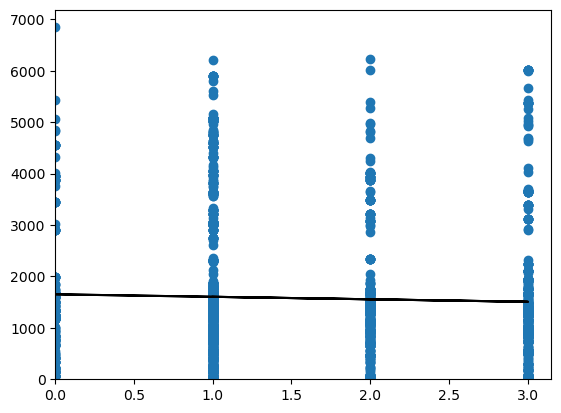

In [62]:
# Step 4: Visualise the regression line

# Plot the data points with a scatterplot.
plt.scatter(x, y)

# Plot the regression line (in black).
plt.plot(x, y_pred, color='black')

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

In [63]:
# Run the Breusch-Pagan test (testing for homoscedasticity)
# Import the necessary library.
import statsmodels.stats.api as sms

# Run the Breusch-Pagan test function on the model residuals and x-variables.
slr_model = sms.het_breuschpagan(slr_model.resid, slr_model.model.exog)

# Print the results of the Breusch-Pagan test.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, slr_model)))

{'LM stat': 1.564305447701253, 'LM Test p-value': 0.21103593179252012, 'F-stat': 1.5639644012699963, 'F-test p-value': 0.21123213228134524}


The p-value can be use to determine homoscedasticity. 
When the p-value is greater/bigger than 0.05, we fail to reject the H0, and assume that homoscedasticity is present. 
Since the LM Test p=0.211, we fail to reject the H0 and assume homoscedasticity.

1282.049584863264


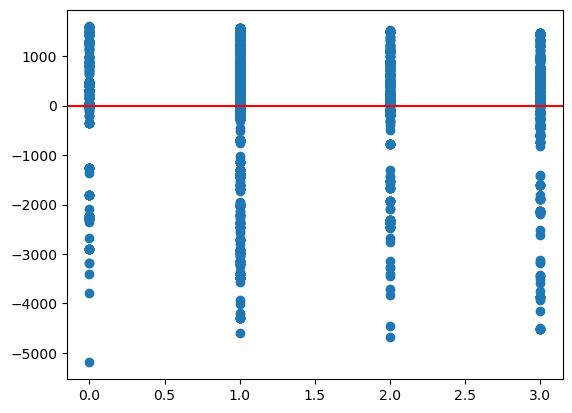

In [64]:
# Step 5: Model Evaluation

# Determine residual 
residual = y_pred - y

# Root Mean Squared Error
rmse = np.sqrt(sum(residual**2)/2000)
print(rmse)

# Residual plot
plt.scatter(x, residual)
plt.axhline(y=0, color='r', linestyle='-')

### 5b) Predict Loyalty points by gender

In [65]:
# Tranform gender variable into dummy variables
# Drop one of the categorical variables to avoid dummy variable trap
df_2 = pd.get_dummies(df_2, drop_first=True)
df_2.head()

,education,age,remuneration,spending_score,loyalty_points,gender_Male
0,1,18,12.30,39,210,1
1,1,23,12.30,81,524,1
2,1,22,13.12,6,40,0
3,1,25,13.12,77,562,0
4,1,33,13.94,40,366,0


In [66]:
fig = px.scatter(df_2, x='gender_Male', y='loyalty_points')
fig.update_traces(marker_size=10)
fig.show()

In [67]:
# Step 1: Build model

# Independent variable.
x = df_2['gender_Male'] 

# Dependent variable.
y = df_2['loyalty_points'] 

# OLS model and summary.
f = 'y ~ x'
slr_model = ols(f, data = df_2).fit()

In [68]:
# Step 2: Model result

# Extract the estimated parameters.
print("Parameters: ", slr_model.params)

# Extract the R squared.
print("R squared: ", slr_model.rsquared) 

# Extract the standard errors.
print("Standard errors: ", slr_model.bse)    

# Extract the predicted values.
print("Predicted values: ", slr_model.predict())  

slr_model.summary()

Parameters:  Intercept    1601.166964
x             -52.579464
dtype: float64
R squared:  0.00041388019161958667
Standard errors:  Intercept    38.345777
x            57.808434
dtype: float64
Predicted values:  [1548.5875     1548.5875     1601.16696429 ... 1548.5875     1548.5875
 1548.5875    ]


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8273
Date:                Mon, 24 Apr 2023   Prob (F-statistic):              0.363
Time:                        19:23:59   Log-Likelihood:                -17151.
No. Observations:                2000   AIC:                         3.431e+04
Df Residuals:                    1998   BIC:                         3.432e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1601.1670     38.346     41.756      0.000    1525.965    1676.369
x            -52.5795     57.808     -0.910      0.363    -165.951      60.792
==============================================================================
Omnibus:                      489.924   Durbin-Watson:                   2.287
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              964.562
Skew:                           1.468   Prob(JB):                    3.53e-210
Kurtosis:                       4.719   Cond. No.                         2.50
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [69]:
# Step 3: Prediction

# Set the X coefficient and the constant to generate the regression table.
y_pred = (1601.1670) + (-52.5795) * df_2['gender_Male']

# View the output.
y_pred

0       1548.5875
1       1548.5875
2       1601.1670
3       1601.1670
4       1601.1670
          ...    
1995    1601.1670
1996    1601.1670
1997    1548.5875
1998    1548.5875
1999    1548.5875
Name: gender_Male, Length: 2000, dtype: float64

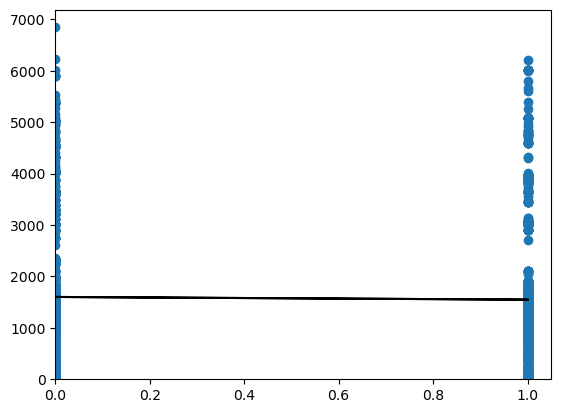

In [70]:
# Step 4: Visualise the regression line

# Plot the data points with a scatterplot.
plt.scatter(x, y)

# Plot the regression line (in black).
plt.plot(x, y_pred, color='black')

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

1282.653339963724


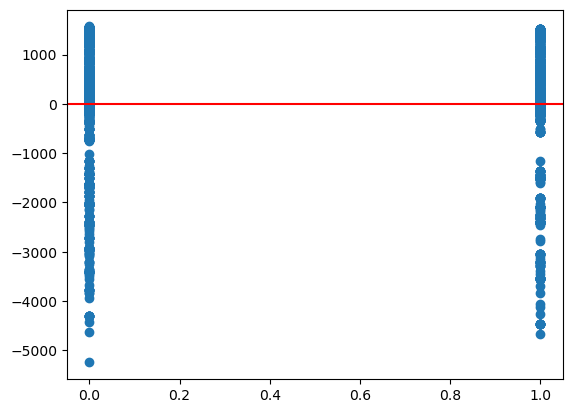

In [71]:
# Step 5: Model Evaluation

# Determine residual 
residual = y_pred - y

# Root Mean Squared Error
rmse = np.sqrt(sum(residual**2)/2000)
print(rmse)

# Residual plot
plt.scatter(x, residual)
plt.axhline(y=0, color='r', linestyle='-')

### 5c) Predict Loyalty points by age

In [72]:
fig = px.scatter(df_2, x='age', y='loyalty_points')
fig.update_traces(marker_size=10)
fig.show()

In [73]:
# Step 1: Build model

# Independent variable.
x = df_2['age'] 

# Dependent variable.
y = df_2['loyalty_points'] 

# OLS model and summary.
f = 'y ~ x'
slr_model = ols(f, data = df_2).fit()

In [74]:
# Step 2: Model result

# Extract the estimated parameters.
print("Parameters: ", slr_model.params)

# Extract the R squared.
print("R squared: ", slr_model.rsquared) 

# Extract the standard errors.
print("Standard errors: ", slr_model.bse)    

# Extract the predicted values.
print("Predicted values: ", slr_model.predict())  

slr_model.summary()

Parameters:  Intercept    1736.517739
x              -4.012805
dtype: float64
R squared:  0.0018015480437204578
Standard errors:  Intercept    88.248731
x             2.113177
dtype: float64
Predicted values:  [1664.2872467  1644.22322095 1648.2360261  ... 1600.0823643  1600.0823643
 1608.1079746 ]


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.606
Date:                Mon, 24 Apr 2023   Prob (F-statistic):             0.0577
Time:                        19:24:00   Log-Likelihood:                -17150.
No. Observations:                2000   AIC:                         3.430e+04
Df Residuals:                    1998   BIC:                         3.431e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1736.5177     88.249     19.678      0.000    1563.449    1909.587
x             -4.0128      2.113     -1.899      0.058      -8.157       0.131
==============================================================================
Omnibus:                      481.477   Durbin-Watson:                   2.277
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              937.734
Skew:                           1.449   Prob(JB):                    2.36e-204
Kurtosis:                       4.688   Cond. No.                         129.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [75]:
# Step 3: Prediction 

# Set the X coefficient and the constant to generate the regression table.
y_pred = (1736.5177) + (-4.0128) * df_2['age']

# View the output.
y_pred

0       1664.2873
1       1644.2233
2       1648.2361
3       1636.1977
4       1604.0953
          ...    
1995    1588.0441
1996    1563.9673
1997    1600.0825
1998    1600.0825
1999    1608.1081
Name: age, Length: 2000, dtype: float64

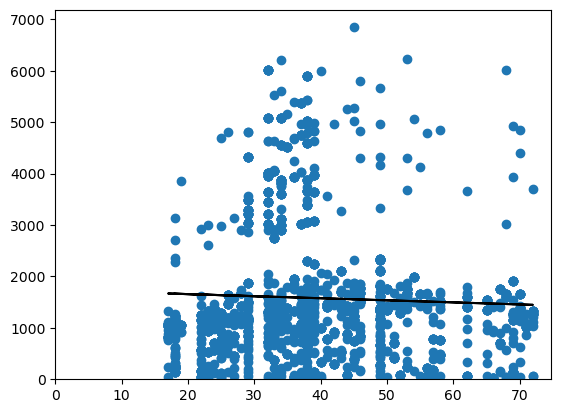

In [76]:
# Step 4: Visualise the regression line

# Plot the data points with a scatterplot.
plt.scatter(x, y)

# Plot the regression line (in black).
plt.plot(x, y_pred, color='black')

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

1281.7627138680002


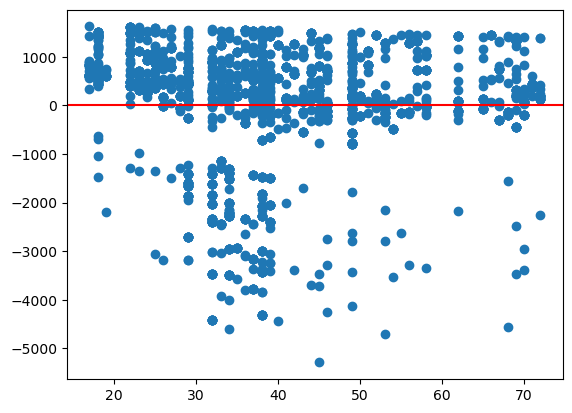

In [77]:
# Step 5: Model Evaluation

# Determine residual 
residual = y_pred - y

# Root Mean Squared Error
rmse = np.sqrt(sum(residual**2)/2000)
print(rmse)

# Residual plot
plt.scatter(x, residual)
plt.axhline(y=0, color='r', linestyle='-')

### 5d) Predict Loyalty points by remuneration

In [78]:
fig = px.scatter(df_2, x='remuneration', y='loyalty_points')
fig.update_traces(marker_size=10)
fig.show()

In [79]:
# Step 1: Build model

# Independent variable.
x = df_2['remuneration'] 

# Dependent variable.
y = df_2['loyalty_points'] 

# OLS model and summary.
f = 'y ~ x'
slr_model = ols(f, data = df_2).fit()

In [80]:
# Step 2: Model result

# Extract the estimated parameters.
print("Parameters: ", slr_model.params)

# Extract the R squared.
print("R squared: ", slr_model.rsquared) 

# Extract the standard errors.
print("Standard errors: ", slr_model.bse)    

# Extract the predicted values.
print("Predicted values: ", slr_model.predict())  

slr_model.summary()

Parameters:  Intercept   -65.686513
x            34.187825
dtype: float64
R squared:  0.3795357732793636
Standard errors:  Intercept    52.170717
x             0.977925
dtype: float64
Predicted values:  [ 354.82374068  354.82374068  382.85775758 ... 3102.15739671 3298.39551499
 3102.15739671]


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     1222.
Date:                Mon, 24 Apr 2023   Prob (F-statistic):          2.43e-209
Time:                        19:24:01   Log-Likelihood:                -16674.
No. Observations:                2000   AIC:                         3.335e+04
Df Residuals:                    1998   BIC:                         3.336e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -65.6865     52.171     -1.259      0.208    -168.001      36.628
x             34.1878      0.978     34.960      0.000      32.270      36.106
==============================================================================
Omnibus:                       21.285   Durbin-Watson:                   3.622
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               31.715
Skew:                           0.089   Prob(JB):                     1.30e-07
Kurtosis:                       3.590   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [81]:
# Step 3: Prediction

# Set the X coefficient and the constant to generate the regression table.
y_pred = (-65.6865) + (34.1878) * df_2['remuneration']

# View the output.
y_pred

0        354.823440
1        354.823440
2        382.857436
3        382.857436
4        410.891432
           ...     
1995    2821.815088
1996    3102.155048
1997    3102.155048
1998    3298.393020
1999    3102.155048
Name: remuneration, Length: 2000, dtype: float64

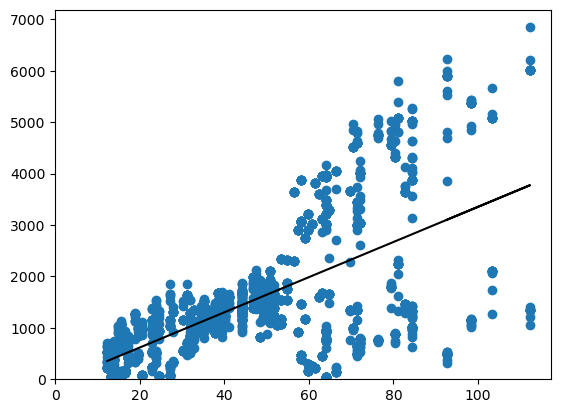

In [82]:
# Step 4: Visualise the regression line

# Plot the data points with a scatterplot.
plt.scatter(x, y)

# Plot the regression line (in black).
plt.plot(x, y_pred, color='black')

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

1010.5494299576327


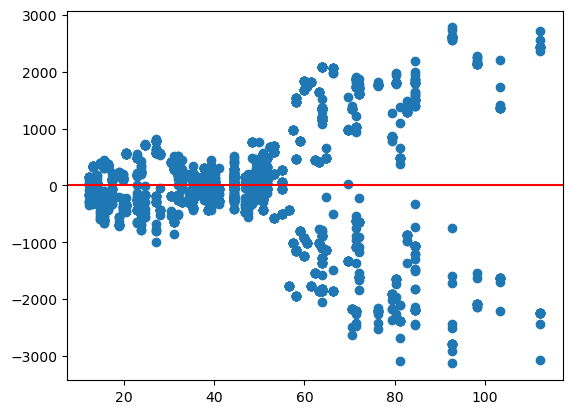

In [83]:
# Step 5: Model Evaluation

# Determine residual 
residual = y_pred - y

# Root Mean Squared Error
rmse = np.sqrt(sum(residual**2)/2000)
print(rmse)

# Residual plot
plt.scatter(x, residual)
plt.axhline(y=0, color='r', linestyle='-')

### 5e) Predict Loyalty points by spending score

In [84]:
fig = px.scatter(df_2, x='spending_score', y='loyalty_points')
fig.update_traces(marker_size=10)
fig.show()

In [85]:
# Step 1: Build model

# Independent variable.
x = df_2['spending_score'] 

# Dependent variable.
y = df_2['loyalty_points'] 

# OLS model and summary.
f = 'y ~ x'
slr_model = ols(f, data = df_2).fit()

In [86]:
# Step 2: Model result

# Extract the estimated parameters.
print("Parameters: ", slr_model.params)

# Extract the R squared.
print("R squared: ", slr_model.rsquared) 

# Extract the standard errors.
print("Standard errors: ", slr_model.bse)    

# Extract the predicted values.
print("Predicted values: ", slr_model.predict())  

slr_model.summary()

Parameters:  Intercept   -75.052663
x            33.061693
dtype: float64
R squared:  0.4520008865838909
Standard errors:  Intercept    45.930554
x             0.814419
dtype: float64
Predicted values:  [1214.35337415 2602.94449102  123.31749662 ... 2933.56142361  453.93442921
  189.44088314]


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.452
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     1648.
Date:                Mon, 24 Apr 2023   Prob (F-statistic):          2.92e-263
Time:                        19:24:01   Log-Likelihood:                -16550.
No. Observations:                2000   AIC:                         3.310e+04
Df Residuals:                    1998   BIC:                         3.312e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -75.0527     45.931     -1.634      0.102    -165.129      15.024
x             33.0617      0.814     40.595      0.000      31.464      34.659
==============================================================================
Omnibus:                      126.554   Durbin-Watson:                   1.191
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              260.528
Skew:                           0.422   Prob(JB):                     2.67e-57
Kurtosis:                       4.554   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [87]:
# Step 3: Prediction 

# Set the X coefficient and the constant to generate the regression table.
y_pred = (-75.0527) + (33.0617) * df_2['spending_score']

# View the output.
y_pred

0       1214.3536
1       2602.9450
2        123.3175
3       2470.6982
4       1247.4153
          ...    
1995    2206.2046
1996     189.4409
1997    2933.5620
1998     453.9345
1999     189.4409
Name: spending_score, Length: 2000, dtype: float64

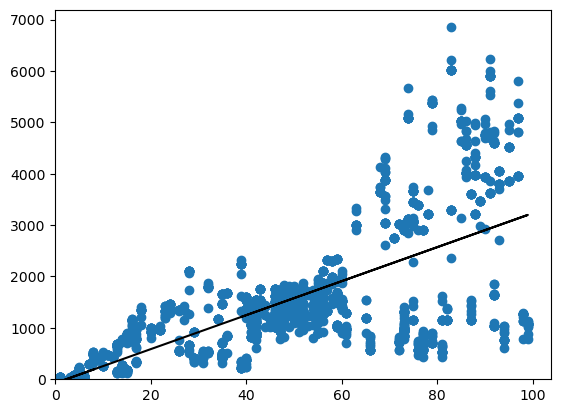

In [88]:
# Step 4: Visualise the regression line

# Plot the data points with a scatterplot.
plt.scatter(x, y)

# Plot the regression line (in black).
plt.plot(x, y_pred, color='black')

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# View the plot.
plt.show()

949.7058558309386


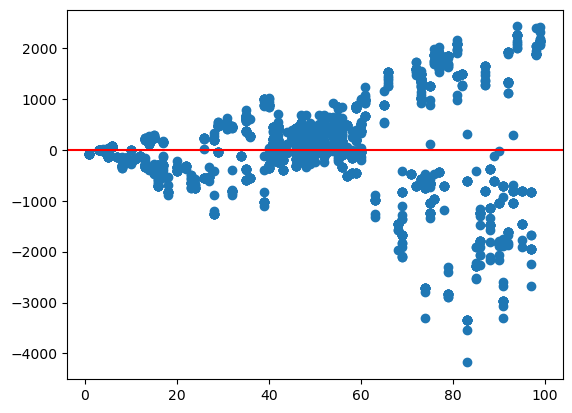

In [89]:
# Step 5: Model Evaluation

# Determine residual 
residual = y_pred - y

# Root Mean Squared Error
rmse = np.sqrt(sum(residual**2)/2000)
print(rmse)

# Residual plot
plt.scatter(x, residual)
plt.axhline(y=0, color='r', linestyle='-')

***Your observations here...***

The Linear Regression model is based on several assumptions which are as follows:-

Linear relationship

Multivariate normality

No or little multi-collinearity

No auto-correlation in error terms

Homoscedasticity




## S1.6 Multiple Linear Regression

### S1.6.1 Estimate correlation coefficients

In [90]:
corr_matrix = df_2.corr()
corr_matrix['loyalty_points'].sort_values(ascending=False)

loyalty_points    1.000000
spending_score    0.672310
remuneration      0.616065
gender_Male      -0.020344
education        -0.036806
age              -0.042445
Name: loyalty_points, dtype: float64

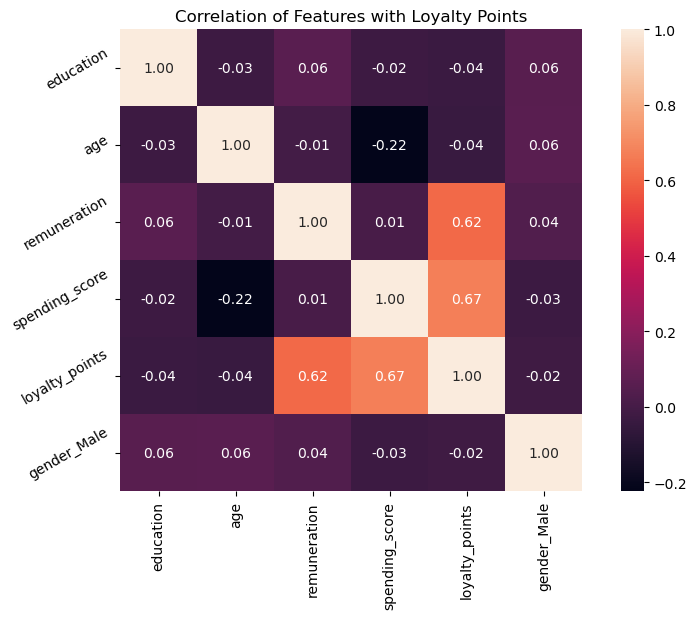

In [91]:
plt.figure(figsize=(10,6))
plt.title('Correlation of Features with Loyalty Points')
a = sns.heatmap(corr_matrix, square=True, annot=True, fmt='.2f', linecolor='white')
a.set_xticklabels(a.get_xticklabels(), rotation=90)
a.set_yticklabels(a.get_yticklabels(), rotation=30)           
plt.show()

Interpretation of correlation coefficient

The correlation coefficient ranges from -1 to +1.

When it is close to +1, this signifies that there is a strong positive correlation. So, we can see that there is a strong positive correlation between loyalty points and spending score, and also between loyalty points and remuneration.

### S1.6.2 MLR[1] Use 5 predictors: gender, edication, age, renumeraion & spending scores

In [92]:
# Step 1: Define features and build the model

# Define the dependent variable.
y = df_2['loyalty_points'] 

# Define the independent variable.
X = df_2[['gender_Male','education','age','remuneration', 'spending_score']] 

# Specify the model.
multi = LinearRegression()  

# Fit the model.
multi.fit(X, y)

LinearRegression()

In [93]:
# Step 2: Call the predictions for X (array).
multi.predict(X)

array([ -262.11450508,  1224.34008292, -1243.37758981, ...,
        4438.2555801 ,  1941.84529986,  1450.59248258])

In [94]:
# Step 3: Checking the value of R-squared, intercept and coefficients.

print("R-squared: ", multi.score(X, y))
print("Intercept: ", multi.intercept_)
print("Coefficients:")

list(zip(X, multi.coef_))

R-squared:  0.8435183876112979
Intercept:  -2071.533541971181
Coefficients:


[('gender_Male', -70.99113229385516),
 ('education', -68.60811252834915),
 ('age', 11.048224049343295),
 ('remuneration', 34.24116377889222),
 ('spending_score', 34.07651113700271)]

In [95]:
# Step 4: Split the data in 'train' (80%) and 'test' (20%) sets.
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42)

print("Original data features:",X.shape,",Train data features:",X_train.shape,",Test data features:",X_test.shape)
print("Original data labels:",y.shape,",Train data labels:",y_train.shape,",Test data labels:",y_test.shape)

Original data features: (2000, 5) ,Train data features: (1600, 5) ,Test data features: (400, 5)
Original data labels: (2000,) ,Train data labels: (1600,) ,Test data labels: (400,)


In [96]:
# Step 5: Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
model = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
Y_pred = model.predict(sm.add_constant(X_test)) 

# Print summary of the model.
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         loyalty_points   R-squared:                       0.846
Model:                            OLS   Adj. R-squared:                  0.846
Method:                 Least Squares   F-statistic:                     1756.
Date:                Mon, 24 Apr 2023   Prob (F-statistic):               0.00
Time:                        19:24:03   Log-Likelihood:                -12226.
No. Observations:                1600   AIC:                         2.446e+04
Df Residuals:                    1594   BIC:                         2.450e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -2068.2548     61.054    -33.876      0.000   -2188.009   -1948.501
gender_Male      -81.3570     25.595     -3.179      0.002    -131.561     -31.153
education        -68.5106     13.037     -5.255      0.000     -94.082     -42.939
age               11.0785      0.964     11.495      0.000       9.188      12.969
remuneration      34.5125      0.548     63.032      0.000      33.439      35.587
spending_score    33.9028      0.499     67.899      0.000      32.923      34.882
==============================================================================
Omnibus:                       19.694   Durbin-Watson:                   2.056
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               21.003
Skew:                           0.235   Prob(JB):                     2.75e-05
Kurtosis:                       3.308   Cond. No.                         402.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [97]:
# Step 6: Run regression on the train subset.
mlr = LinearRegression()  
mlr.fit(X_train, y_train)

LinearRegression()

In [98]:
# Step 7: Call the predictions for X in the train set.
y_train_pred = mlr.predict(X_train)  

# Print the predictions.
print("Prediction for train set: {}".format(y_train_pred)) 

Prediction for train set: [1730.22570752  867.49982897 2178.0038368  ... 1711.38458743 1388.81172043
 1432.01118475]


In [99]:
# Step 8: Print the R-squared value.
print(mlr.score(X_test, y_test)*100)  

83.16575388940468


In [100]:
# Step 7: Call the predictions for X in the train set.
y_test_pred = mlr.predict(X_test)  

# Print the predictions.
print("Prediction for test set: {}".format(y_test_pred)) 

Prediction for test set: [ -504.3628155   2931.22620885  2673.53960507  1228.06163559
  1607.02279475  1863.668438     414.53805526  1299.53530326
  1351.04422988  3251.8077058   1288.99785399  1650.73912309
  1702.5848761   2282.20865029  1290.88657243  1451.03848895
  1759.61861242   738.16882313    40.16648093  -825.64415903
  1546.07381766   -27.97536761  1799.68862266  1233.60255332
  1484.58367946  1276.13451133  3874.95453277  1680.22874709
  1501.75624371  1910.44399204    18.8890547    598.44014159
  1004.01132553  1574.45987478  1659.52784821  1426.14554123
   823.26046853  2173.09603247  1362.84393152  1217.12655926
  1104.39564095  1493.02485727  1323.89051213  4226.68299453
  4427.07774996  -282.5594705   1574.45987478  1607.02279475
  1693.87204657  1627.11324587  1444.32174496   841.44030173
  1030.51748842  -567.76617641  2013.97449466  1482.45511903
   527.57870573  4089.91779969  1414.27777999  3234.16057936
  1626.34918311  1362.84393152  1066.03675366  1607.02279475

In [101]:
# Step 9: Model Evaluation

# Call the metrics.mean_absolute_error function.  
print('Mean Absolute Error (Final):', metrics.mean_absolute_error(y_test, y_test_pred))  

# Call the metrics.mean_squared_error function.
print('Mean Square Error (Final):', metrics.mean_squared_error(y_test, y_test_pred))  

Mean Absolute Error (Final): 395.3164613570207
Mean Square Error (Final): 272996.35553889745


In [102]:
# Step 9: Check multicollinearity.
x_temp = sm.add_constant(X_train)

# Create an empty DataFrame. 
vif = pd.DataFrame()

# Calculate the VIF for each value.
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values,
                                               i) for i in range(x_temp.values.shape[1])]

# Create the feature columns.
vif['features'] = x_temp.columns

# Print the values to one decimal points.
print(vif.round(1))

   VIF Factor        features
0        23.4           const
1         1.0     gender_Male
2         1.0       education
3         1.1             age
4         1.0    remuneration
5         1.1  spending_score


In [103]:
# Step 10: Determine heteroscedasticity.
model = sms.het_breuschpagan(model.resid, model.model.exog) 
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, model)))

{'LM stat': 46.22141852716428, 'LM Test p-value': 8.186564965077344e-09, 'F-stat': 9.483583054988577, 'F-test p-value': 6.3286317699912605e-09}


### S1.6.3 MLR[2] Use 4 predictors: education, age, renumeraion & spending scores

In [104]:
# Step 1: Define features and build the model

# Define the dependent variable.
y = df_2['loyalty_points'] 

# Define the independent variable.
X = df_2[['gender_Male','age','remuneration', 'spending_score']] 

# Specify the model.
multi = LinearRegression()  

# Fit the model.
multi.fit(X, y)

LinearRegression()

In [105]:
# Step 2: Call the predictions for X (array).
multi.predict(X)

array([ -302.0330342 ,  1188.69040745, -1277.90345741, ...,
        4391.90021467,  2025.68944842,  1534.39993955])

In [106]:
# Step 3: Checking the value of R-squared, intercept and coefficients.

print("R-squared: ", multi.score(X, y))
print("Intercept: ", multi.intercept_)
print("Coefficients:")

list(zip(X, multi.coef_))

R-squared:  0.8408286273368282
Intercept:  -2176.817015053215
Coefficients:


[('gender_Male', -78.48404790837176),
 ('age', 11.223667980703995),
 ('remuneration', 34.07387775207342),
 ('spending_score', 34.157264327207834)]

In [107]:
# Step 4: Split the data in 'train' (80%) and 'test' (20%) sets.
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42)

print("Original data features:",X.shape,",Train data features:",X_train.shape,",Test data features:",X_test.shape)
print("Original data labels:",y.shape,",Train data labels:",y_train.shape,",Test data labels:",y_test.shape)

Original data features: (2000, 4) ,Train data features: (1600, 4) ,Test data features: (400, 4)
Original data labels: (2000,) ,Train data labels: (1600,) ,Test data labels: (400,)


In [108]:
# Step 5: Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
model = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
Y_pred = model.predict(sm.add_constant(X_test)) 

# Print summary of the model.
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         loyalty_points   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.843
Method:                 Least Squares   F-statistic:                     2152.
Date:                Mon, 24 Apr 2023   Prob (F-statistic):               0.00
Time:                        19:24:03   Log-Likelihood:                -12240.
No. Observations:                1600   AIC:                         2.449e+04
Df Residuals:                    1595   BIC:                         2.452e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -2166.9000     58.579    -36.991      0.000   -2281.800   -2052.000
gender_Male      -89.4450     25.761     -3.472      0.001    -139.975     -38.915
age               11.1871      0.972     11.515      0.000       9.282      13.093
remuneration      34.3103      0.551     62.300      0.000      33.230      35.391
spending_score    33.9367      0.503     67.413      0.000      32.949      34.924
==============================================================================
Omnibus:                       15.675   Durbin-Watson:                   2.057
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               16.744
Skew:                           0.201   Prob(JB):                     0.000231
Kurtosis:                       3.300   Cond. No.                         382.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [109]:
# Step 6: Run regression on the train subset.
mlr = LinearRegression()  
mlr.fit(X_train, y_train)

LinearRegression()

In [110]:
# Step 7: Call the predictions for X in the train set.
y_train_pred = mlr.predict(X_train)  

# Print the predictions.
print("Prediction for train set: {}".format(y_train_pred)) 

Prediction for train set: [1622.19767695  839.52913489 2219.90823831 ... 1743.76520002 1350.33955188
 1387.65606814]


In [111]:
# Step 8: Print the R-squared value.
print(mlr.score(X_test, y_test)*100)  

82.88517529572442


In [112]:
# Step 7: Call the predictions for X in the train set.
y_test_pred = mlr.predict(X_test)  

# Print the predictions.
print("Prediction for test set: {}".format(y_test_pred)) 

Prediction for test set: [-4.71092266e+02  3.03188383e+03  2.63745823e+03  1.26007944e+03
  1.57415332e+03  1.83387680e+03  3.66339270e+02  1.33255551e+03
  1.30892683e+03  3.20946577e+03  1.32720472e+03  1.60922588e+03
  1.73674055e+03  2.37823813e+03  1.32065145e+03  1.40873432e+03
  1.64633504e+03  7.63357284e+02  1.25242611e+01 -9.24680508e+02
  1.50679126e+03  4.31227488e+00  1.68823388e+03  1.33780660e+03
  1.45284816e+03  1.36886950e+03  3.82838176e+03  1.56560544e+03
  1.58589065e+03  1.88116631e+03  1.26146001e+02  6.19300008e+02
  9.55829525e+02  1.67012909e+03  1.62016365e+03  1.32762201e+03
  9.28018853e+02  2.14264717e+03  1.39674462e+03  1.11819986e+03
  1.06635275e+03  1.52148207e+03  1.35305065e+03  4.17880949e+03
  4.31534085e+03 -3.11104867e+02  1.67012909e+03  1.57415332e+03
  1.79423190e+03  1.72798576e+03  1.40137847e+03  8.77927455e+02
  9.31986524e+02 -4.57495366e+02  1.90580918e+03  1.44542664e+03
  4.28738860e+02  4.11898492e+03  1.50211451e+03  3.19689083e+03


In [113]:
# Step 9: Model Evaluation

# Call the metrics.mean_absolute_error function.  
print('Mean Absolute Error (Final):', metrics.mean_absolute_error(y_test, y_test_pred))  

# Call the metrics.mean_squared_error function.
print('Mean Square Error (Final):', metrics.mean_squared_error(y_test, y_test_pred))  

Mean Absolute Error (Final): 400.0919756199411
Mean Square Error (Final): 277546.4216965218


In [114]:
# Step 9: Check multicollinearity.
x_temp = sm.add_constant(X_train)

# Create an empty DataFrame. 
vif = pd.DataFrame()

# Calculate the VIF for each value.
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values,
                                               i) for i in range(x_temp.values.shape[1])]

# Create the feature columns.
vif['features'] = x_temp.columns

# Print the values to one decimal points.
print(vif.round(1))

   VIF Factor        features
0        21.2           const
1         1.0     gender_Male
2         1.1             age
3         1.0    remuneration
4         1.1  spending_score


In [115]:
# Step 10: Determine heteroscedasticity.
model = sms.het_breuschpagan(model.resid, model.model.exog) 
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, model)))

{'LM stat': 40.36912353124791, 'LM Test p-value': 3.630577316988176e-08, 'F-stat': 10.321152428407698, 'F-test p-value': 2.9781274861268866e-08}


### S1.6.4 MLR[3] Use 3 predictors: age, renumeraion & spending scores

In [116]:
# Step 1: Define features and build the model

# Define the dependent variable.
y = df_2['loyalty_points'] 

# Define the independent variable.
X = df_2[['age','remuneration', 'spending_score']] 

# Specify the model.
multi = LinearRegression()  

# Fit the model.
multi.fit(X, y)

LinearRegression()

In [117]:
# Step 2: Call the predictions for X (array).
multi.predict(X)

array([ -252.52008641,  1238.47746341, -1308.43606252, ...,
        4434.8905332 ,  2066.35892261,  1575.56389984])

In [118]:
# Step 3: Checking the value of R-squared, intercept and coefficients.

print("R-squared: ", multi.score(X, y))
print("Intercept: ", multi.intercept_)
print("Coefficients:")

list(zip(X, multi.coef_))

R-squared:  0.8399114912748795
Intercept:  -2203.059751307901
Coefficients:


[('age', 11.060658711843349),
 ('remuneration', 34.00838549260249),
 ('spending_score', 34.18319657763366)]

In [119]:
# Step 4: Split the data in 'train' (80%) and 'test' (20%) sets.
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42)

print("Original data features:",X.shape,",Train data features:",X_train.shape,",Test data features:",X_test.shape)
print("Original data labels:",y.shape,",Train data labels:",y_train.shape,",Test data labels:",y_test.shape)

Original data features: (2000, 3) ,Train data features: (1600, 3) ,Test data features: (400, 3)
Original data labels: (2000,) ,Train data labels: (1600,) ,Test data labels: (400,)


In [120]:
# Step 5: Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
model = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
Y_pred = model.predict(sm.add_constant(X_test)) 

# Print summary of the model.
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         loyalty_points   R-squared:                       0.842
Model:                            OLS   Adj. R-squared:                  0.842
Method:                 Least Squares   F-statistic:                     2846.
Date:                Mon, 24 Apr 2023   Prob (F-statistic):               0.00
Time:                        19:24:03   Log-Likelihood:                -12246.
No. Observations:                1600   AIC:                         2.450e+04
Df Residuals:                    1596   BIC:                         2.452e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -2197.0105     58.134    -37.792      0.000   -2311.037   -2082.984
age               11.0137      0.974     11.313      0.000       9.104      12.923
remuneration      34.2457      0.552     62.004      0.000      33.162      35.329
spending_score    33.9681      0.505     67.253      0.000      32.977      34.959
==============================================================================
Omnibus:                       14.722   Durbin-Watson:                   2.050
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               15.856
Skew:                           0.189   Prob(JB):                     0.000360
Kurtosis:                       3.308   Cond. No.                         377.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [121]:
# Step 6: Run regression on the train subset.
mlr = LinearRegression()  
mlr.fit(X_train, y_train)

LinearRegression()

In [122]:
# Step 7: Call the predictions for X in the train set.
y_train_pred = mlr.predict(X_train)  

# Print the predictions.
print("Prediction for train set: {}".format(y_train_pred)) 

Prediction for train set: [1581.73296854  796.88423068 2185.24039458 ... 1789.93373561 1399.81947689
 1437.21562445]


In [123]:
# Step 8: Print the R-squared value.
print(mlr.score(X_test, y_test)*100)  

82.90723396315803


In [124]:
# Step 7: Call the predictions for X in the train set.
y_test_pred = mlr.predict(X_test)  

# Print the predictions.
print("Prediction for test set: {}".format(y_test_pred)) 

Prediction for test set: [-4.25709053e+02  2.99343559e+03  2.60003812e+03  1.22401268e+03
  1.53391529e+03  1.79212254e+03  4.18943142e+02  1.38614741e+03
  1.36427501e+03  3.26123743e+03  1.28766114e+03  1.65894130e+03
  1.69575771e+03  2.33734079e+03  1.27743942e+03  1.46204653e+03
  1.69474080e+03  8.09214691e+02 -2.63922829e+01 -9.61682267e+02
  1.55468086e+03  5.11057805e+01  1.64730047e+03  1.29858491e+03
  1.41546811e+03  1.42269406e+03  3.87919648e+03  1.61275266e+03
  1.63341589e+03  1.84791589e+03  8.88818487e+01  6.70246855e+02
  1.00427573e+03  1.71837726e+03  1.66852576e+03  1.28842071e+03
  8.91492831e+02  2.09899697e+03  1.36106930e+03  1.07872564e+03
  1.02910663e+03  1.57353521e+03  1.40597357e+03  4.23039314e+03
  4.27476021e+03 -3.51451403e+02  1.71837726e+03  1.53391529e+03
  1.84020998e+03  1.77547954e+03  1.36186127e+03  8.42143578e+02
  8.92577110e+02 -4.98080057e+02  1.95151882e+03  1.49956756e+03
  3.88942654e+02  4.07828006e+03  1.54909408e+03  3.16017028e+03


In [125]:
# Step 9: Model Evaluation

# Call the metrics.mean_absolute_error function.  
print('Mean Absolute Error (Final):', metrics.mean_absolute_error(y_test, y_test_pred))  

# Call the metrics.mean_squared_error function.
print('Mean Square Error (Final):', metrics.mean_squared_error(y_test, y_test_pred))  

Mean Absolute Error (Final): 402.2350305637691
Mean Square Error (Final): 277188.70233220584


In [126]:
# Step 9: Check multicollinearity.
x_temp = sm.add_constant(X_train)

# Create an empty DataFrame. 
vif = pd.DataFrame()

# Calculate the VIF for each value.
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values,
                                               i) for i in range(x_temp.values.shape[1])]

# Create the feature columns.
vif['features'] = x_temp.columns

# Print the values to one decimal points.
print(vif.round(1))

   VIF Factor        features
0        20.7           const
1         1.1             age
2         1.0    remuneration
3         1.1  spending_score


In [127]:
# Step 10: Determine heteroscedasticity.
model = sms.het_breuschpagan(model.resid, model.model.exog) 
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, model)))

{'LM stat': 39.20687709402326, 'LM Test p-value': 1.569051868116325e-08, 'F-stat': 13.36375609804432, 'F-test p-value': 1.2899128216958638e-08}


### S1.6.5 MLR[4] Use 2 predictors: renumeraion & spending scores

In [128]:
# Step 1: Define features and build the model

# Define the dependent variable.
y = df_2['loyalty_points'] 

# Define the independent variable.
X = df_2[['remuneration', 'spending_score']] 

# Specify the model.
multi = LinearRegression()  

# Fit the model.
multi.fit(X, y)

LinearRegression()

In [129]:
# Step 2: Call the predictions for X (array).
multi.predict(X)

array([ 4.57831319e-01,  1.38195101e+03, -1.05713790e+03, ...,
        4.44147048e+03,  2.16956070e+03,  1.71137682e+03])

In [130]:
# Step 3: Checking the value of R-squared, intercept and coefficients.

print("R-squared: ", multi.score(X, y))
print("Intercept: ", multi.intercept_)
print("Coefficients:")

list(zip(X, multi.coef_))

R-squared:  0.826913470198926
Intercept:  -1700.305097014438
Coefficients:


[('remuneration', 33.97949882180282), ('spending_score', 32.89269468782101)]

In [131]:
# Step 4: Split the data in 'train' (80%) and 'test' (20%) sets.
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42)

print("Original data features:",X.shape,",Train data features:",X_train.shape,",Test data features:",X_test.shape)
print("Original data labels:",y.shape,",Train data labels:",y_train.shape,",Test data labels:",y_test.shape)

Original data features: (2000, 2) ,Train data features: (1600, 2) ,Test data features: (400, 2)
Original data labels: (2000,) ,Train data labels: (1600,) ,Test data labels: (400,)


In [132]:
# Step 5: Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
model = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
Y_pred = model.predict(sm.add_constant(X_test)) 

# Print summary of the model.
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         loyalty_points   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     3895.
Date:                Mon, 24 Apr 2023   Prob (F-statistic):               0.00
Time:                        19:24:04   Log-Likelihood:                -12307.
No. Observations:                1600   AIC:                         2.462e+04
Df Residuals:                    1597   BIC:                         2.464e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1700.3237     39.588    -42.950      0.000   -1777.974   -1622.674
remuneration      34.3346      0.574     59.838      0.000      33.209      35.460
spending_score    32.6439      0.510     63.947      0.000      31.643      33.645
==============================================================================
Omnibus:                        2.977   Durbin-Watson:                   2.034
Prob(Omnibus):                  0.226   Jarque-Bera (JB):                2.923
Skew:                           0.075   Prob(JB):                        0.232
Kurtosis:                       3.147   Cond. No.                         220.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [133]:
# Step 6: Run regression on the train subset.
mlr = LinearRegression()  
mlr.fit(X_train, y_train)

LinearRegression()

In [134]:
# Step 7: Call the predictions for X in the train set.
y_train_pred = mlr.predict(X_train)  

# Print the predictions.
print("Prediction for train set: {}".format(y_train_pred)) 

Prediction for train set: [1630.49111009  512.07788432 2146.32624449 ... 1422.83416662 1259.61480693
 1441.17214231]


In [135]:
# Step 8: Print the R-squared value.
print(mlr.score(X_test, y_test)*100)  

81.44236432529975


In [136]:
# Step 7: Call the predictions for X in the train set.
y_test_pred = mlr.predict(X_test)  

# Print the predictions.
print("Prediction for test set: {}".format(y_test_pred)) 

Prediction for test set: [ -725.11711735  2976.65149188  2644.50590347  1416.28990278
  1434.2479047   1535.45165243   709.53845826  1358.38381754
  1577.07452533  3212.92022784  1170.66219209  1588.48826342
  1589.70563198  2360.07003078  1201.63127443  1582.78139438
  1642.74224297   657.71921584  -106.10091912  -833.24510268
  1354.27429082  -188.12929636  1754.52233399  1256.34267501
  1422.83416662  1616.64263488  3855.98127081  1541.53849524
  1742.27120111  1956.16988192   128.11305348   859.2893165
  1075.54528717  1575.01976198  1484.84977857  1179.64119305
   979.28846095  1756.19712359  1517.4936505    979.28846095
  1217.15453924  1577.07452533  1440.79216854  4253.41460309
  4257.06670877  -454.98714089  1575.01976198  1434.2479047
  1474.65340904  1468.94654     1548.46273285   960.11309046
   796.89373078  -647.57824059  1640.30750585  1527.31004626
   311.72515222  3974.30562567  1548.46273285  3233.31296689
  1306.94454888  1517.4936505   1283.27967791  1434.2479047
  

In [137]:
# Step 9: Model Evaluation

# Call the metrics.mean_absolute_error function.  
print('Mean Absolute Error (Final):', metrics.mean_absolute_error(y_test, y_test_pred))  

# Call the metrics.mean_squared_error function.
print('Mean Square Error (Final):', metrics.mean_squared_error(y_test, y_test_pred))  

Mean Absolute Error (Final): 429.6636201690913
Mean Square Error (Final): 300944.09178342693


In [138]:
# Step 9: Check multicollinearity.
x_temp = sm.add_constant(X_train)

# Create an empty DataFrame. 
vif = pd.DataFrame()

# Calculate the VIF for each value.
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values,
                                               i) for i in range(x_temp.values.shape[1])]

# Create the feature columns.
vif['features'] = x_temp.columns

# Print the values to one decimal points.
print(vif.round(1))

   VIF Factor        features
0         8.9           const
1         1.0    remuneration
2         1.0  spending_score


In [139]:
# Step 10: Determine heteroscedasticity.
model = sms.het_breuschpagan(model.resid, model.model.exog) 
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, model)))

{'LM stat': 45.093019717500304, 'LM Test p-value': 1.6150098749730242e-10, 'F-stat': 23.156868353554007, 'F-test p-value': 1.2194606385153543e-10}


# Section 2: Clustering the customers

## S2.1 Prepartion

In [140]:
# Import necessary libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings('ignore')

In [141]:
# Load the CSV file(s) as df2.
df2 = pd.read_csv('reviews_cleaned.csv')

# View DataFrame.
df2.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [142]:
# Drop unnecessary columns.
df2 = df2.drop(columns=['gender', 'age', 'loyalty_points', 'product', 'review', 'summary','education'])

# View DataFrame.
df2.head()

,remuneration,spending_score
0,12.30,39
1,12.30,81
2,13.12,6
3,13.12,77
4,13.94,40


In [143]:
# Explore the data.
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   remuneration    2000 non-null   float64
 1   spending_score  2000 non-null   int64  
dtypes: float64(1), int64(1)
memory usage: 31.4 KB


In [144]:
# Descriptive statistics.
df2.describe()

,remuneration,spending_score
count,2000.000000,2000.000000
mean,48.079060,50.000000
std,23.123984,26.094702
min,12.300000,1.000000
25%,30.340000,32.000000
50%,47.150000,50.000000
75%,63.960000,73.000000
max,112.340000,99.000000


## S2.2 Plot

<Axes: xlabel='remuneration', ylabel='spending_score'>

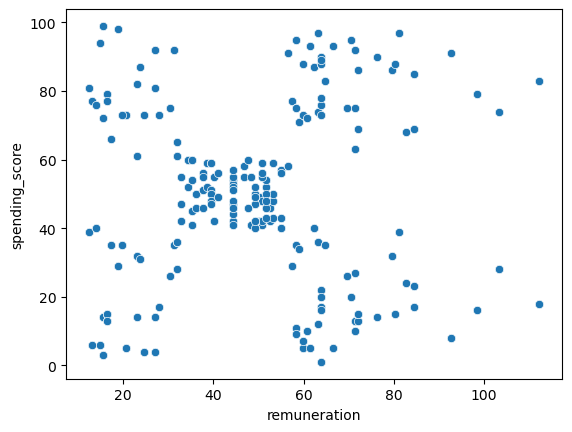

In [145]:
# Create a scatterplot with Seaborn.
sns.scatterplot(x='remuneration',
                y='spending_score',
                data=df2)

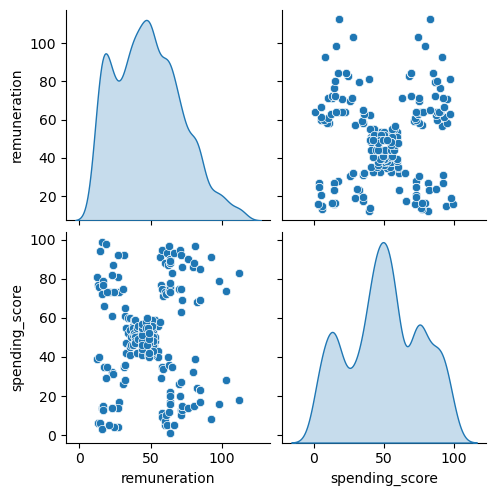

In [146]:
# Create a pairplot with Seaborn.
x = df2[['remuneration', 'spending_score']]

sns.pairplot(df2,
             vars=x,
             diag_kind= 'kde')

## S2.3 Elbow and silhoutte methods

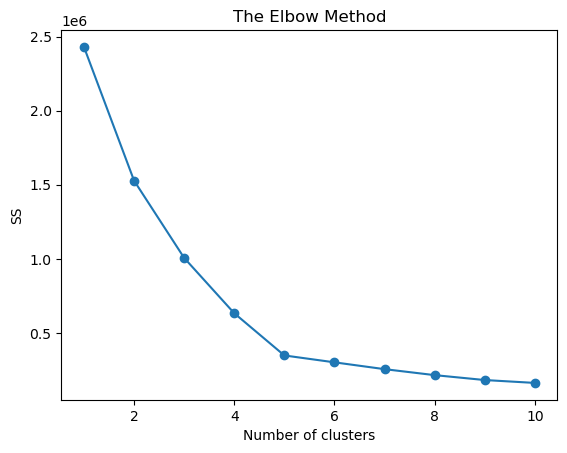

In [147]:
# Determine the number of clusters: Elbow method.
ss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i,
                    init = 'k-means++', 
                    max_iter = 500,
                    n_init = 10,
                    random_state = 42)
    kmeans.fit(x)
    ss.append(kmeans.inertia_)

plt.plot(range(1, 11),
         ss,
         marker='o')

plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("SS")

plt.show()

This plot suggests that the elbow is formed with K value around 5. After K=5, the SSE starts decreasing slowly.

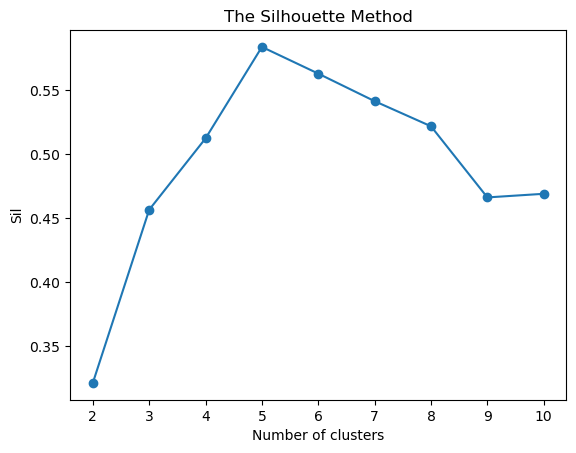

In [148]:
# Determine the number of clusters: Silhouette method.
sil = []
kmax = 10

for k in range(2, kmax+1):
    kmeans_s = KMeans(n_clusters = k).fit(x)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(x,
                                labels,
                                metric = 'euclidean'))

# Plot the silhouette method.
plt.plot(range(2, kmax+1),
         sil,
         marker='o')

plt.title("The Silhouette Method")
plt.xlabel("Number of clusters")
plt.ylabel("Sil")

plt.show()


The Average Silhouette Index is high for K-value around 5-7.

## 4. Evaluate k-means model at different values of *k*

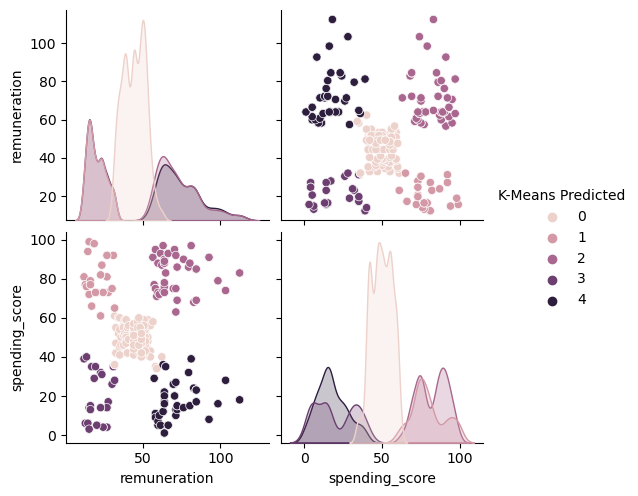

In [149]:
# Use 5 clusters:
kmeans = KMeans(n_clusters = 5,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(x)

clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Check the number of observations per predicted class.
x['K-Means Predicted'].value_counts()

# Plot the predicted.
sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind= 'kde')

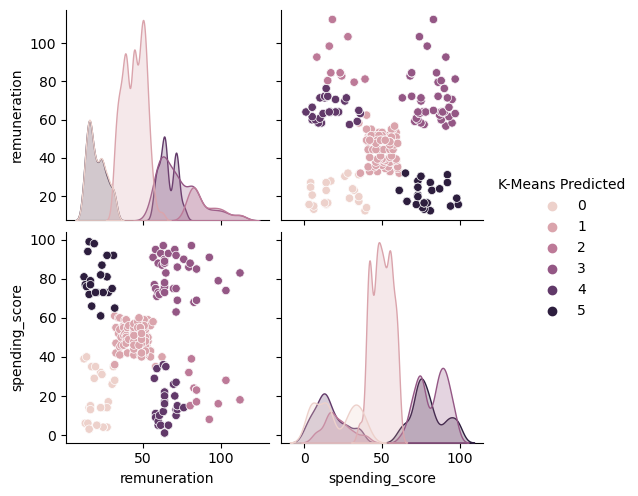

In [150]:
# Use 6 clusters:
kmeans = KMeans(n_clusters = 6,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(x)

clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Check the number of observations per predicted class.
x['K-Means Predicted'].value_counts()

# Plot the predicted.
sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind= 'kde')

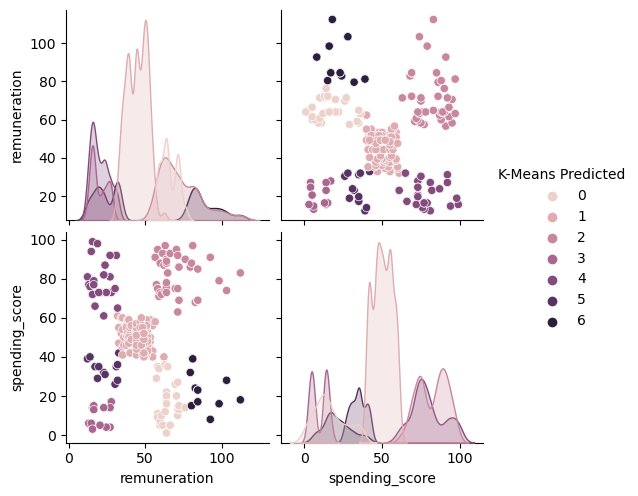

In [151]:
# Use 7 clusters:
kmeans = KMeans(n_clusters = 7,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(x)

clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Check the number of observations per predicted class.
x['K-Means Predicted'].value_counts()

# Plot the predicted.
sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind= 'kde')

## 5. Fit final model and justify your choice

> Let's use five clusters.

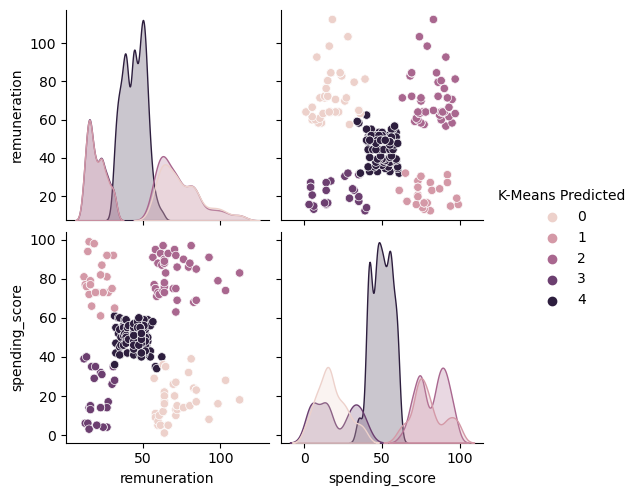

In [152]:
# Apply the final model.
# Use 5 clusters:
kmeans = KMeans(n_clusters = 5,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(x)

clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(x,
             hue='K-Means Predicted',
             diag_kind= 'kde')

In [153]:
# Check the number of observations per predicted class.
# View the K-Means predicted.
print(x.head())

   remuneration  spending_score  K-Means Predicted
0         12.30              39                  3
1         12.30              81                  1
2         13.12               6                  3
3         13.12              77                  1
4         13.94              40                  3


## 6. Plot and interpret the clusters

<Axes: xlabel='remuneration', ylabel='spending_score'>

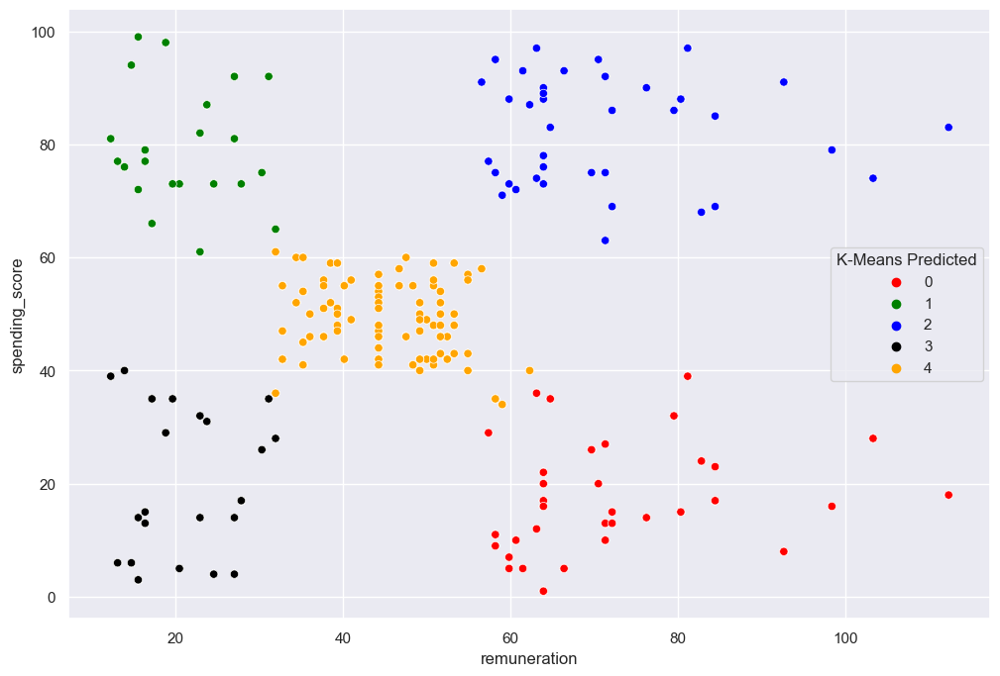

In [154]:
# Visualising the clusters.
# Visualising the clusters.
# Set plot size.
sns.set(rc = {'figure.figsize':(12, 8)})

sns.scatterplot(x='remuneration' , 
                y ='spending_score',
                data=x ,
                hue='K-Means Predicted',
                palette=['red', 'green', 'blue', 'black', 'orange'])

# View the DataFrame.


## 1. Load and explore the data

In [155]:
# Import all the necessary packages.
import pandas as pd
import numpy as np
import nltk 
import os 
import matplotlib.pyplot as plt

# nltk.download ('punkt').
# nltk.download ('stopwords').

from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from textblob import TextBlob
from scipy.stats import norm

# Import Counter.
from collections import Counter

import warnings
warnings.filterwarnings('ignore')

In [156]:
# Load the data set as df3.
df3 = pd.read_csv('reviews_cleaned.csv')

# View DataFrame.
df3.head()

,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [157]:
# Keep necessary columns. Drop unnecessary columns.
df3 = df3[['review', 'summary']]

# View DataFrame.
df3.head()

,review,summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,As my review of GF9's previous screens these w...,Money trap


In [158]:
# Determine if there are any missing values.
df3.isna().sum()

review     0
summary    0
dtype: int64

## 2. Prepare the data for NLP
### 2a) Change to lower case and join the elements in each of the columns respectively (review and summary)

In [159]:
# Review: Change all to lower case and join with a space.
df3['review'] = df3['review'].apply(lambda x: " ".join(x.lower() for x in x.split()))
df3['review'].head()

0    when it comes to a dm's screen, the space on t...
1    an open letter to galeforce9*: your unpainted ...
2    nice art, nice printing. why two panels are fi...
3    amazing buy! bought it as a gift for our new d...
4    as my review of gf9's previous screens these w...
Name: review, dtype: object

In [160]:
# Summary: Change all to lower case and join with a space.
df3['summary'] = df3['summary'].apply(lambda x: " ".join(x.lower() for x in x.split()))
df3['summary'].head()

0    the fact that 50% of this space is wasted on a...
1    another worthless dungeon master's screen from...
2                      pretty, but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 2b) Replace punctuation in each of the columns respectively (review and summary)

In [161]:
# Replace all the punctuations in review column.
df3['review'] = df3['review'].str.replace('[^\w\s]','')

# View output.
df3['review'].head()

0    when it comes to a dms screen the space on the...
1    an open letter to galeforce9 your unpainted mi...
2    nice art nice printing why two panels are fill...
3    amazing buy bought it as a gift for our new dm...
4    as my review of gf9s previous screens these we...
Name: review, dtype: object

In [162]:
# Replace all the puncuations in summary column.
df3['summary'] = df3['summary'].str.replace('[^\w\s]','')

# View output.
df3['summary'].head()

0    the fact that 50 of this space is wasted on ar...
1    another worthless dungeon masters screen from ...
2                       pretty but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 2c) Drop duplicates in both columns

In [163]:
# Drop duplicates in both columns.
df3 = df3.drop_duplicates()

# View DataFrame.
df3.reset_index(inplace=True)
df3.head()

,index,review,summary
0,0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,2,nice art nice printing why two panels are fill...,pretty but also pretty useless
3,3,amazing buy bought it as a gift for our new dm...,five stars
4,4,as my review of gf9s previous screens these we...,money trap


## 3. Tokenise and create wordclouds

In [164]:
# Create new DataFrame (copy DataFrame).
df4 = df3

# View DataFrame.
df4.head()

,index,review,summary
0,0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,2,nice art nice printing why two panels are fill...,pretty but also pretty useless
3,3,amazing buy bought it as a gift for our new dm...,five stars
4,4,as my review of gf9s previous screens these we...,money trap


In [165]:
# Review: Create a word cloud.

# String all the reviews together in a single variable.
# Create an empty string variable.
all_reviews = ''

for i in range(df4.shape[0]):
    all_reviews = all_reviews + df4['review'][i]

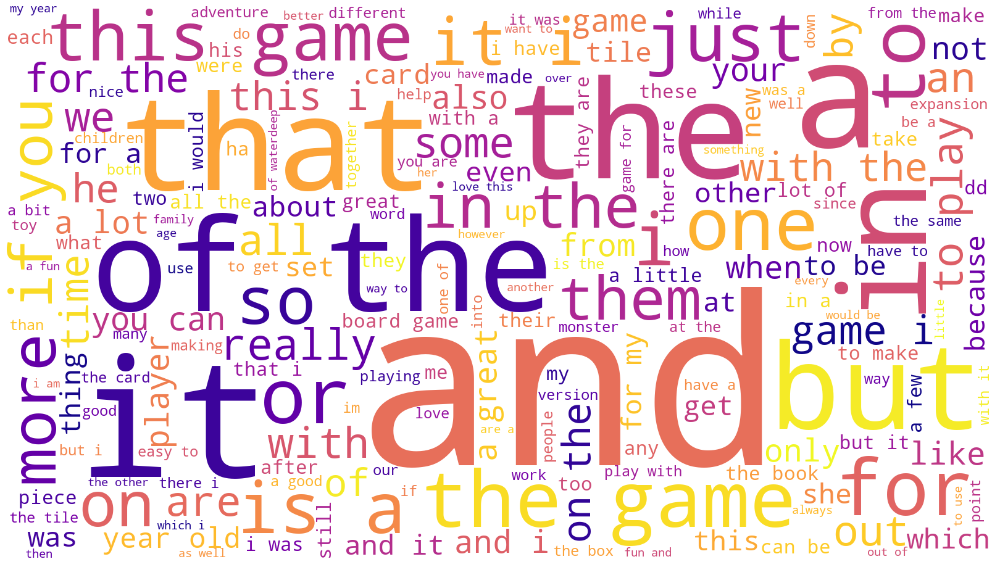

In [166]:
# Review: Plot the WordCloud image.
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(all_reviews) 

# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()


In [167]:
# Summary: Create a word cloud.
# String all the summaries together in a single variable.
# Create an empty string variable.
all_summaries = ''

for i in range(df4.shape[0]):
    all_summaries = all_summaries + df4['summary'][i]

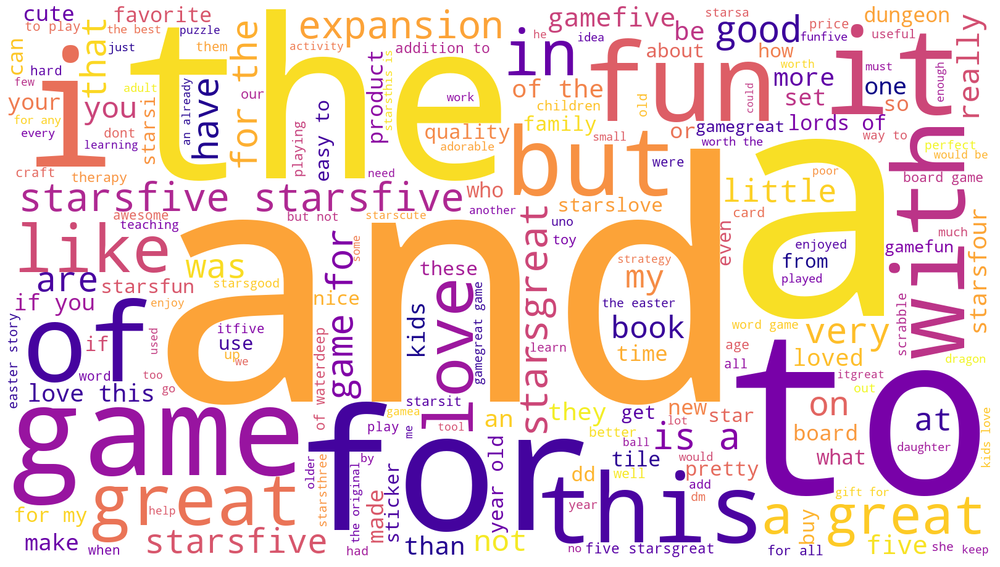

In [168]:
# Summary: Plot the WordCloud image.
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(all_summaries) 

# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()


## 4. Frequency distribution and polarity
### 4a) Create frequency distribution

In [169]:
# Apply tokenisation to both columns.
df4['token_r'] = df4['review'].apply(word_tokenize)
df4['token_s'] = df4['summary'].apply(word_tokenize)

# View DataFrame.
df4['token_r'].head()

0    [when, it, comes, to, a, dms, screen, the, spa...
1    [an, open, letter, to, galeforce9, your, unpai...
2    [nice, art, nice, printing, why, two, panels, ...
3    [amazing, buy, bought, it, as, a, gift, for, o...
4    [as, my, review, of, gf9s, previous, screens, ...
Name: token_r, dtype: object

In [170]:
# Determine the frequency distribution.

# Define an empty list of tokens.
all_r = []
for i in range(df4.shape[0]):
    # Add each token to the list.
    all_r = all_r + df4['token_r'][i]
    
fd_r = FreqDist(all_r)
fd_r

FreqDist({'the': 5451, 'and': 3233, 'to': 3162, 'a': 3160, 'of': 2488, 'i': 2090, 'it': 2083, 'is': 1782, 'this': 1776, 'game': 1671, ...})

In [171]:
# Define an empty list of tokens.
all_s = []
for i in range(df4.shape[0]):
    # Add each token to the list.
    all_s = all_s + df4['token_s'][i]
    
fd_s = FreqDist(all_s)
fd_s

FreqDist({'stars': 427, 'five': 342, 'game': 319, 'great': 295, 'the': 261, 'a': 240, 'for': 232, 'fun': 218, 'to': 192, 'and': 168, ...})

### 4b) Remove alphanumeric characters and stopwords

In [172]:
# Delete all the alpanum.
reviews = [word for word in all_r if word.isalnum()]
summaries = [word for word in all_s if word.isalnum()]

In [173]:
# Remove all the stopwords
# Create a set of English stopwords.
english_stopwords = set(stopwords.words('english'))

### 4c) Create wordcloud without stopwords

In [174]:
# Create a filtered list of tokens without stopwords.
reviews2 = [x for x in reviews if x.lower() not in english_stopwords]
summaries2 = [x for x in summaries if x.lower() not in english_stopwords]

In [175]:
reviews2_string = ''
for value in reviews:
    # Add each filtered token word to the string.
    reviews2_string = reviews2_string + value + ' '
    
summaries2_string = ''
for value in summaries:
    # Add each filtered token word to the string.
    summaries2_string = summaries2_string + value + ' '

### 4d) Identify 15 most common words and polarity

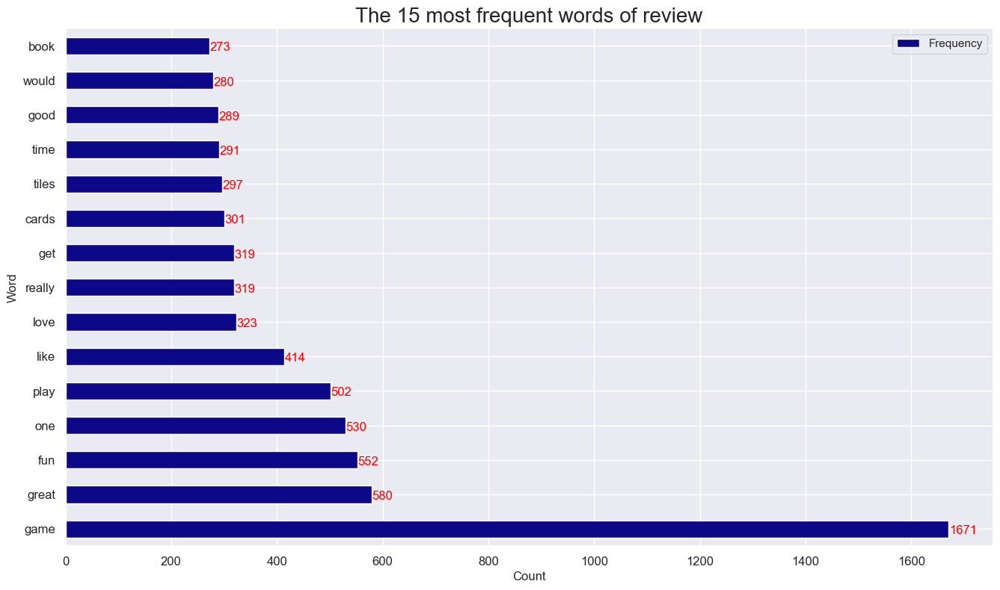

In [176]:
# Determine the 15 most common words.

# Import the Counter class.
from collections import Counter

# Generate a DataFrame from Counter.
counts = pd.DataFrame(Counter(reviews2).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Set the plot type.
ax = counts.plot(kind='barh', figsize=(16, 9), fontsize=12,
                 colormap ='plasma')

# Set the labels.
ax.set_xlabel('Count', fontsize=12)
ax.set_ylabel('Word', fontsize=12)
ax.set_title("The 15 most frequent words of review",
             fontsize=20)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width()+.41, i.get_y()+.1, str(round((i.get_width()), 2)),
            fontsize=12, color='red')

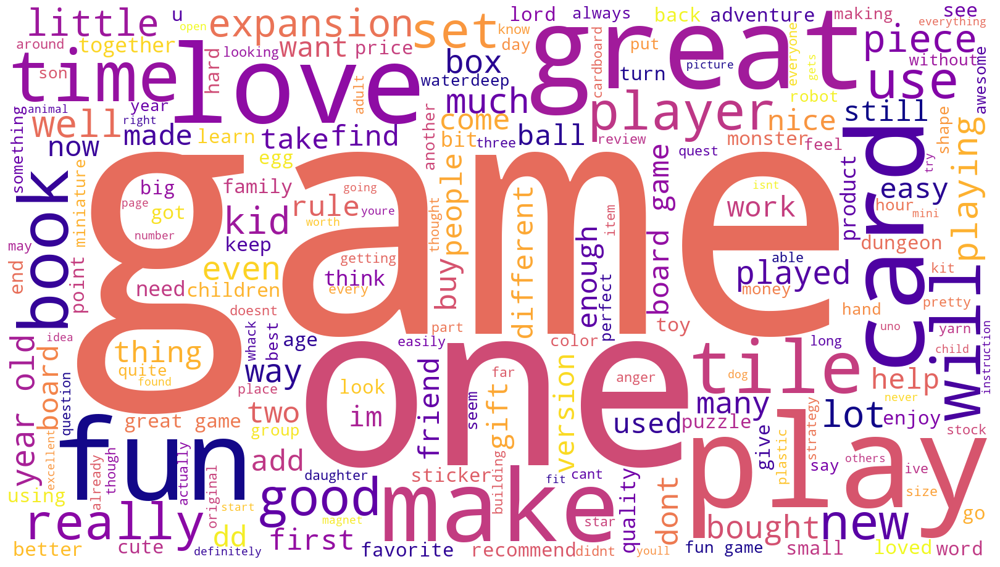

In [177]:
# Create a wordcloud without stop words.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(reviews2_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

Quite positive in general.

## 5. Review polarity and sentiment: Plot histograms of polarity (use 15 bins) and sentiment scores for the respective columns.

In [178]:
# Provided function.
# Import the necessary package
from textblob import TextBlob

# Define a function to extract a polarity score for the review.
def generate_polarity(review):
    '''Extract polarity score (-1 to +1) for each comment'''
    return TextBlob(review).sentiment[0]

# Populate a new column with polarity scores for each review.
df4['polarity_r'] = df4['review'].apply(generate_polarity)

# Preview the result.
df4['polarity_r'].head()

0   -0.036111
1    0.035952
2    0.116640
3    0.578788
4   -0.316667
Name: polarity_r, dtype: float64

In [179]:
# Determine polarity of both columns. 
# Define a function to extract a polarity score for the review.
def generate_polarity(summary):
    return TextBlob(summary).sentiment[0]

# Populate a new column with polarity scores for each review.
df4['polarity_s'] = df4['summary'].apply(generate_polarity)

# Preview the result.
df4['polarity_s'].head()

0    0.15
1   -0.80
2    0.00
3    0.00
4    0.00
Name: polarity_s, dtype: float64

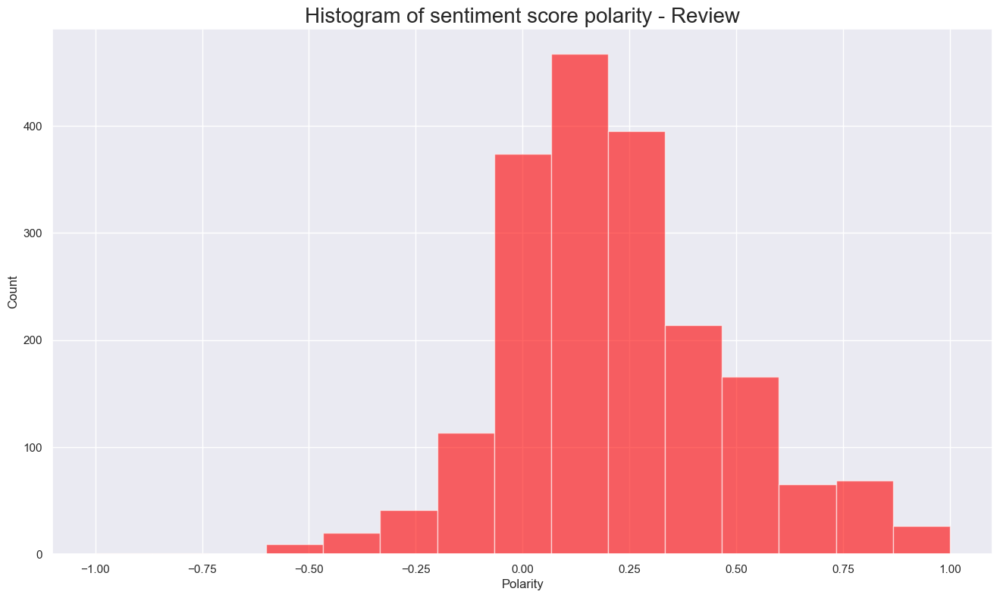

In [180]:
# Review: Create a histogram plot with bins = 15.
# Histogram of polarity
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df4['polarity_r'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity - Review', fontsize=20)

plt.show()

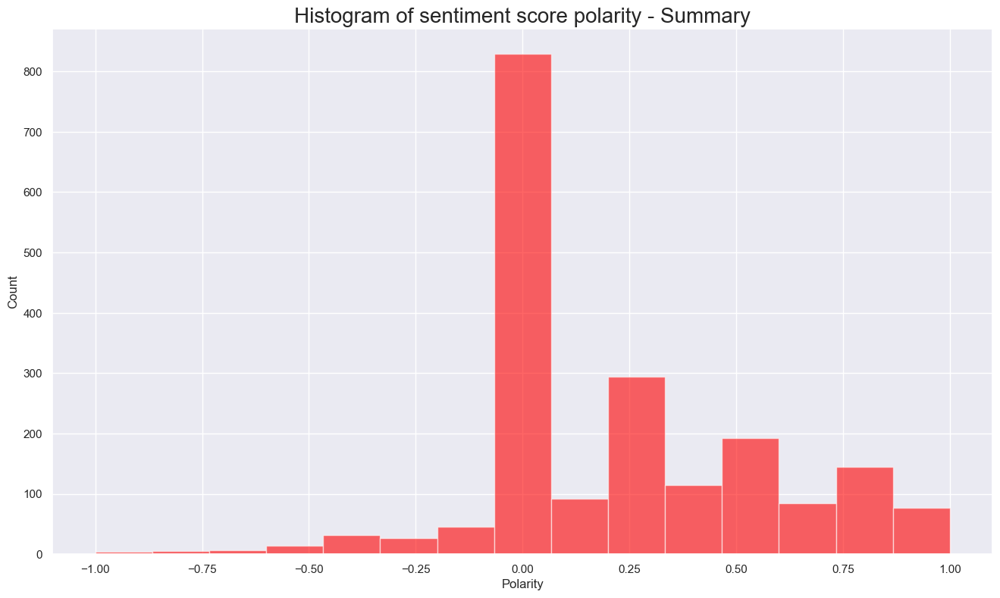

In [181]:
# Summary: Create a histogram plot with bins = 15.
# Histogram of polarity
num_bins = 15

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df4['polarity_s'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity - Summary', fontsize=20)

plt.show()

## 6. Identify top 20 positive and negative reviews and summaries respectively

In [182]:
# Top 20 negative reviews.
negative_r = df4.nsmallest(20, 'polarity_r')
negative_r = negative_r[['review','summary']]

# View output.
negative_r.style.set_properties(subset=['review'], **{'width': '600px'})

,review,summary
207,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not,boring unless you are a craft person which i am
181,incomplete kit very disappointing,incomplete kit
1773,im sorry i just find this product to be boring and to be frank juvenile,disappointing
362,one of my staff will be using this game soon so i dont know how well it works as yet but after looking at the cards i believe it will be helpful in getting a conversation started regarding anger and what to do to control it,anger control game
116,i bought this as a christmas gift for my grandson its a sticker book so how can i go wrong with this gift,stickers
226,this was a gift for my daughter i found it difficult to use,two stars
229,i found the directions difficult,three stars
289,instructions are complicated to follow,two stars
300,difficult,three stars
1501,expensive for what you get,two stars


In [183]:
# Top 20 negative summaries.
negative_s = df4.nsmallest(20, 'polarity_s')
negative_s = negative_s[['summary','review']]

# View output.
negative_s.style.set_properties(subset=['review'], **{'width': '600px'})

,summary,review
21,the worst value ive ever seen,these are cute tatoos for those who love pirates however the retail price is 150 and amazons price is more than double i have never paid over the retail price for an item at amazon i was shocked there are only a handful of tatoos and for 150 i wouldnt mind but to charge 350 for an item that sells anywhere else for 150 is criminal find it at a local drugstore and save your
207,boring unless you are a craft person which i am,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not
819,boring,ive discovered that im really new school when it comes to my board games except for boggle and a couple chess boards and a novelty version of yahtzee this is the oldest game i own by more than 30 years its very watered down for my usual tastes gameplay consists of playing tiles on a board to start expand or merge hotel chains then you buy stocks trying to predict which ones will grow so you can buy as low as possible and sell them for huge profits by the end of the game the player with the most money at the end wins i think this game is certainly better with more people it can accommodate up to 6 and that may be too many ive never played with that number but with 3 or fewer it is too easy to run away with the game more players offers more competition and gaps between your turns and dilutes the available stock with three you can see what tiles you have available and buy up huge amounts of stock early before other players have time to react and attempt to thwart your plan or prevent you from a big payout ive enjoyed power grid and have intended on playing a deeper economic game for some time but this certainly isnt it this is much more shallow an experience although it does play reasonably quickly and may fill a shorter time slot if players are looking for a quick buy and sell stock game
1148,before this i hated running any rpg campaign dealing with towns because it,before this i hated running any rpg campaign dealing with towns because it kills the momentum and just becomes 2 hours of haggling for magic items this helps open up story ideas and plot hooks
1,another worthless dungeon masters screen from galeforce9,an open letter to galeforce9 your unpainted miniatures are very not bad your spell cards are great your board games are meh your dm screens however are freaking terrible im still waiting for a single screen that isnt polluted with pointless artwork where useful referenceable tables should be once again youve created a single use screen that is only useful when running the storm kings thunder adventure even despite the fact that its geared to that adventure path its usefulness negligible at best i massive swath of the inner panel is wasted on artwork and a bloated overland map which could have been easily reduced to a single panel in size and the few table you have are nighuseless themselves in short stop making crap dm screens
143,disappointed,my kids grew up with a peg bench and hammer and loved it but i bought this brand for my grandson and was disappointed the pegs fit too loosely into the bench and he does not even use his hammer to pound them in as he can just push them in with his hand or sometimes they fall through automatically my suggestion is to make the pegs fit a little tighter so the kids can learn skills of coordination etc when pounding them in the pegs are nice and thick for little hands but just not snug enough fitting to really use the toy as it is intended
623,disappointed,eggs split and were unusable
785,disappointed,my mom already owned an acquire game but she always commented on how poorly it was made so i thought i would get her a new one for christmas the quality of this one was not much better her old one had cards for each player to see how much each hotel cost to buy according to how many tiles it had this one did not even have that i expected better quality for the pri

In [184]:
# Top 20 positive reviews.
positive_r = df4.nlargest(20, 'polarity_r')
positive_r = positive_r[['review','summary']]

# View output.
positive_r.style.set_properties(subset=['review'], **{'width': '600px'})

,review,summary
7,came in perfect condition,five stars
164,awesome book,five stars
193,awesome gift,five stars
489,excellent activity for teaching selfmanagement skills,five stars
517,perfect just what i ordered,five stars
583,wonderful product,five stars
601,delightful product,five stars
613,wonderful for my grandson to learn the resurrection story,five stars
782,perfect,aquire game
923,awesome,five stars


In [185]:
# Top 20 positive summaries.
positive_s = df4.nlargest(20, 'polarity_s')
positive_s = positive_s[['summary','review']]

# View output.
positive_s.style.set_properties(subset=['review'], **{'width': '600px'})

,summary,review
6,best gm screen ever,i have bought many gm screens over the years but this one is the best i have ever seen it has all the relevant information i need and no crap filler on it very happy with this screen
28,wonderful designs,these are intricate designs for older children and adults this book is full of beautiful designs just waiting to be awakened by your choice of colors great for creativity
32,perfect,awesome my 8 year olds favorite xmas gift its 915 am xmas morning and hes already colored three of these
80,theyre the perfect size to keep in the car or a diaper,my daughter loves these little books theyre the perfect size to keep in the car or a diaper bag or purse i keep them on hand for times when were stuck waiting in a doctors office or anywhere else
133,perfect for preschooler,this occupied my almost3 year old for nearly an hour stickers were durable and easy to peel afterwards he kept going back to the box to see if there were more robot stickers to assemble in there ill probably drop another dollar and buy it again for his christmas stocking three cheers for the short memory of a preschooler
139,awesome sticker activity for the price,i bought 8 of these for my 3 year old daughters robot themed birthday party as favors for the little ones and it was a great hit i didnt realize that the stickers were robot parts that the kids assemble themselves to create their own robots that was a lot of fun and for the price it was well worth it
160,awesome book,my 8 year old son loves this drawing book loves it
162,he was very happy with his gift,this was a christmas present for a nephew who loves to draw and he loves superheroes he was very happy with his gift
186,awesome,great product took a little practice and time but after you get the hang of it it turns into a cute cuddly little friend mine didnt turn out exactly like the picture but it adds a taste of your own sense of style they are super cute and comes with everything it says it will
209,awesome and welldesigned for 9 year olds,i was skeptical but my 9 year old has had so much fun with this kit and it was her favorite christmas present she pretty much made the puppies herself with minimal help from me though i did hot glue some ears rather than use the included glue only downside is the cuttings can be messy but really wonderful instructions wellmade supplies and can be used for many yearsand maybe even making different animals if you are creative highly recommend for artsy determined 9 year olds i actually want to try to make one myself they are so darn cute


# 